In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal

from sklearn.model_selection import train_test_split

import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
from cartopy.util import add_cyclic_point

import hvplot.xarray

from mlprecip_utils import *

import warnings

/homes/kpegion/.conda/envs/ml-precip/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/homes/kpegion/.conda/envs/ml-precip/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/homes/kpegion/.conda/envs/ml-precip/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/homes/kpegion/.conda/envs/ml-precip/lib

In [2]:
warnings.filterwarnings("ignore")

### Set Variables for plotting, region, etc.

In [3]:
cmap='DryWet'
clevs=np.arange(-0.8,0.9,0.1)
labels=['Positive','Neutral','Negative']
v='precip'
lat_reg=[24.0,36.0]
lon_reg=[269.0,283.0]
winter=[12,1,2]
summer=[6,7,8]

### Read Daily GPCP Precip Data

In [4]:
fnames='/scratch/zmanthos/GPCP/gpcp_v01r03_daily.*.nc'
ds=getPrecipData(fnames,'1996-12-15','2020-01-15').rename({'latitude':'lat','longitude':'lon'}).reset_coords(['longitude_bnds','latitude_bnds'],drop=True)

In [5]:
ds

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 180, lon: 360, time: 8432)
Coordinates:
  * lon        (lon) float32 0.0 1.0 2.0 3.0 4.0 ... 356.0 357.0 358.0 359.0
  * lat        (lat) float32 -90.0 -89.0 -88.0 -87.0 ... 86.0 87.0 88.0 89.0
  * time       (time) datetime64[ns] 1996-12-15 1996-12-16 ... 2020-01-15
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] dask.array<chunksize=(17, 2), meta=np.ndarray>
    precip     (time, lat, lon) float32 dask.array<chunksize=(17, 180, 360), meta=np.ndarray>
Attributes: (12/47)
    CDI:                        Climate Data Interface version 1.8.2 (http://...
    history:                    Thu Sep 17 20:06:27 2020: cdo cat /scratch/zm...
    source:                     /data1/GPCP_CDR/GPCP_Output/1DD//bin/199610/s...
    institution:                ACADEMIC > UMD/ESSIC > Earth System Science I...
    Conventions:                CF-1.6, ACDD 1.3
    title:                      Global Precipitation Climatatology Project (G...
    ...                         ...
    product_version:            v01r03
    platform:                   GOES (Geostationary Operational Environmental...
    sensor:                     Imager, TOVS > TIROS Operational Vertical Sou...
    spatial_resolution:         1 degree
    comment:                    Processing computer: eagle2.umd.edu
    CDO:                        Climate Data Operators version 1.8.2 (http://...

### Subset to SE US

In [6]:
ds_seus=ds.sel(lat=slice(lat_reg[0],lat_reg[1]),lon=slice(lon_reg[0],lon_reg[1]))
ds_seus

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 13, lon: 15, time: 8432)
Coordinates:
  * lon        (lon) float32 269.0 270.0 271.0 272.0 ... 280.0 281.0 282.0 283.0
  * lat        (lat) float32 24.0 25.0 26.0 27.0 28.0 ... 33.0 34.0 35.0 36.0
  * time       (time) datetime64[ns] 1996-12-15 1996-12-16 ... 2020-01-15
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] dask.array<chunksize=(17, 2), meta=np.ndarray>
    precip     (time, lat, lon) float32 dask.array<chunksize=(17, 13, 15), meta=np.ndarray>
Attributes: (12/47)
    CDI:                        Climate Data Interface version 1.8.2 (http://...
    history:                    Thu Sep 17 20:06:27 2020: cdo cat /scratch/zm...
    source:                     /data1/GPCP_CDR/GPCP_Output/1DD//bin/199610/s...
    institution:                ACADEMIC > UMD/ESSIC > Earth System Science I...
    Conventions:                CF-1.6, ACDD 1.3
    title:                      Global Precipitation Climatatology Project (G...
    ...                         ...
    product_version:            v01r03
    platform:                   GOES (Geostationary Operational Environmental...
    sensor:                     Imager, TOVS > TIROS Operational Vertical Sou...
    spatial_resolution:         1 degree
    comment:                    Processing computer: eagle2.umd.edu
    CDO:                        Climate Data Operators version 1.8.2 (http://...

### Calculate anoms in SEUS Region

In [9]:
ds_anoms=ds_seus.groupby('time.month')-ds_seus.groupby('time.month').mean()
ds_anoms

<xarray.Dataset>
Dimensions:  (lat: 13, lon: 15, time: 8432)
Coordinates:
  * lon      (lon) float32 269.0 270.0 271.0 272.0 ... 280.0 281.0 282.0 283.0
  * lat      (lat) float32 24.0 25.0 26.0 27.0 28.0 ... 32.0 33.0 34.0 35.0 36.0
  * time     (time) datetime64[ns] 1996-12-15 1996-12-16 ... 2020-01-15
    month    (time) int64 12 12 12 12 12 12 12 12 12 12 ... 1 1 1 1 1 1 1 1 1 1
Data variables:
    precip   (time, lat, lon) float32 dask.array<chunksize=(17, 13, 15), meta=np.ndarray>

### Make index by averaging over region

In [10]:
ds_anoms_index=ds_anoms.mean(dim=['lat','lon'])
ds_anoms_index

<xarray.Dataset>
Dimensions:  (time: 8432)
Coordinates:
  * time     (time) datetime64[ns] 1996-12-15 1996-12-16 ... 2020-01-15
    month    (time) int64 12 12 12 12 12 12 12 12 12 12 ... 1 1 1 1 1 1 1 1 1 1
Data variables:
    precip   (time) float32 dask.array<chunksize=(17,), meta=np.ndarray>

### Plot Index by Season

In [11]:
ds_anoms_index.hvplot.line(by='time.season',x='time.year',subplots=True).cols(2)

:NdLayout   [time.season]
   :Curve   [time.year]   (precip)

### Plot Seasonal Mean and Standard Deviation

In [12]:
ds_seus['precip'].mean(dim=['lat','lon']).groupby('time.season').mean().hvplot.bar(title='Seasonal Mean SEUS Precip')+\
ds_anoms_index['precip'].groupby('time.season').std().hvplot.bar(title='Seasonal Std SEUS Precip',shared_axes=False)

:Layout
   .Bars.I  :Bars   [season,Variable]   (value)
   .Bars.II :Bars   [season,Variable]   (value)

### Read Monthly Climate Indices from ESRL/PSL 
AMO, NAO, NINO34, PDO

In [13]:
indices=['amo','nao','nino34','pdo']

ds_indices_list=[]
for i in indices:
    
    df=pd.read_table('/data/ccsm4/kpegion/obs2/CLIM_INDICES/'+i+'.txt',skiprows=1,
                     header=None,delim_whitespace=True,
                     index_col=0,parse_dates=True,
                     na_values=['-99.9','-99.90','-99.99']).dropna()
    
    start_date=str(df.index[0])+'-'+str(df.columns[0])+'-01'
    end_date=str(df.index[-1])+'-'+str(df.columns[-1])+'-01'
    dates=pd.date_range(start=start_date,end=end_date,freq='MS') + pd.DateOffset(days=14)
    clim_index=df.T.unstack().values
    ds_index=xr.DataArray(clim_index.astype('float'),coords={'time':dates},dims=['time'])      
    
    ds_indices_list.append(ds_index.to_dataset(name=i))

ds_indices_list.append(ds_anoms_index)

ds_indices=xr.merge(ds_indices_list).dropna(dim='time')
ds_indices=ds_indices.resample(time='1D').interpolate("linear").sel(time=slice('1997-01-01','2019-12-31'))

In [14]:
ds_indices

<xarray.Dataset>
Dimensions:  (time: 8400)
Coordinates:
  * time     (time) datetime64[ns] 1997-01-01 1997-01-02 ... 2019-12-31
Data variables:
    amo      (time) float64 -0.1305 -0.1284 -0.1264 ... 0.1208 0.1186 0.1164
    nao      (time) float64 -1.225 -1.214 -1.204 -1.194 ... 1.034 1.035 1.035
    nino34   (time) float64 -0.5797 -0.5761 -0.5726 ... 0.5561 0.5587 0.5613
    pdo      (time) float64 0.1126 0.121 0.1294 0.1377 ... 0.4281 0.3894 0.3506
    precip   (time) float32 dask.array<chunksize=(8400,), meta=np.ndarray>

### Detrend and Standardize Indices

In [15]:
for v in list(ds_indices.keys()):

    detrend=signal.detrend(ds_indices[v],axis=0,type='linear')     
    ds_indices[v]=xr.DataArray(detrend,coords={'time': ds_indices['time'].values},dims=['time'])     
    
ds_indices=(ds_indices-ds_indices.mean(dim='time'))/ds_indices.std(dim='time')

### Quick Look Plots of Indices

In [16]:
ds_indices.hvplot.line(x='time',subplots=True,shared_axes=False).cols(2)

:NdLayout   [Variable]
   :Curve   [time]   (value)

### Main Program

Winter
AMO
Positive 558
Neutral 539
Negative 978
NAO
Positive 1195
Neutral 499
Negative 381
NINO34
Positive 906
Neutral 209
Negative 960
PDO
Positive 939
Neutral 596
Negative 540
Check Features and Target Dimensions
Features (X):  (2075, 4)
Target (Y):  (2075,)
Samples:  2075
Features:  4
Training Size:  1660
Testing Size:  415
Check Stats:  Index:  amo Mean:  -0.547338937422697 Var:  0.5538545080175439
Check Stats:  Index:  nao Mean:  0.09159034759743899 Var:  0.9793855761558625
Check Stats:  Index:  nino34 Mean:  -0.17237617635058394 Var:  1.4223392460344704
Check Stats:  Index:  pdo Mean:  -0.016491506938941115 Var:  0.9698008264200892
R^2 Train Standard :  0.5090737531891608
R^2 Train LASSO :  0.5086416455135623
R^2 Train Ridge :  0.5090689811967632
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
R^2 Train NN:  0.8929055572843989
R^2 Test Standard:  0.6089299465435811
R^2 Test Lasso:  0.6217024113477557
R^2 Test 

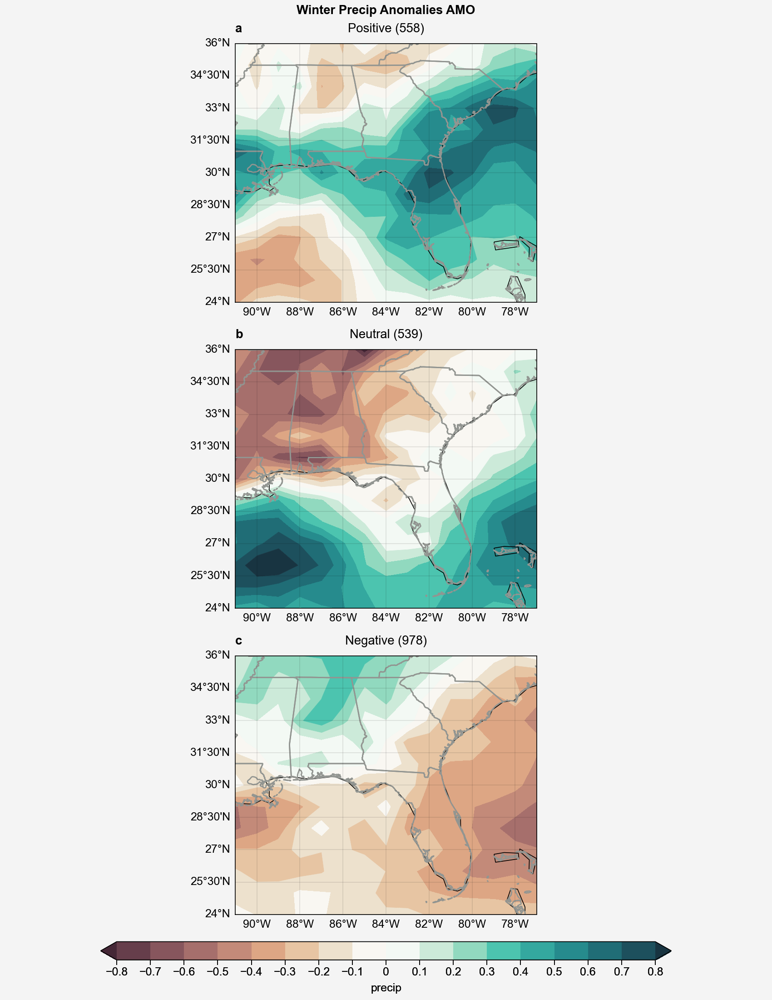

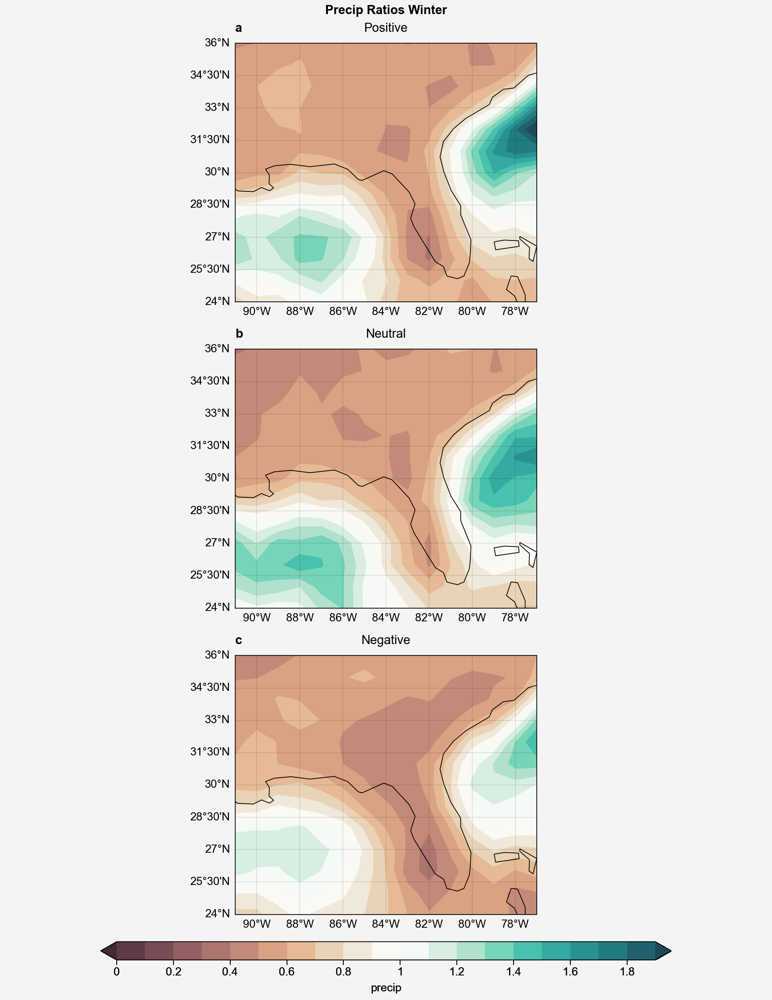

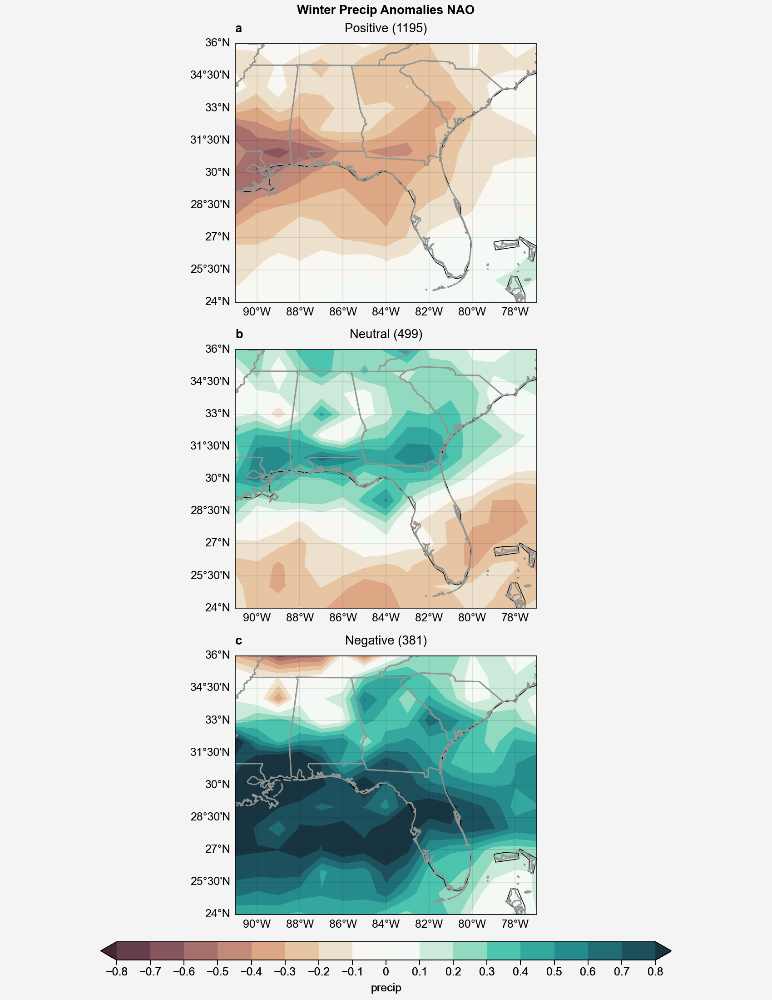

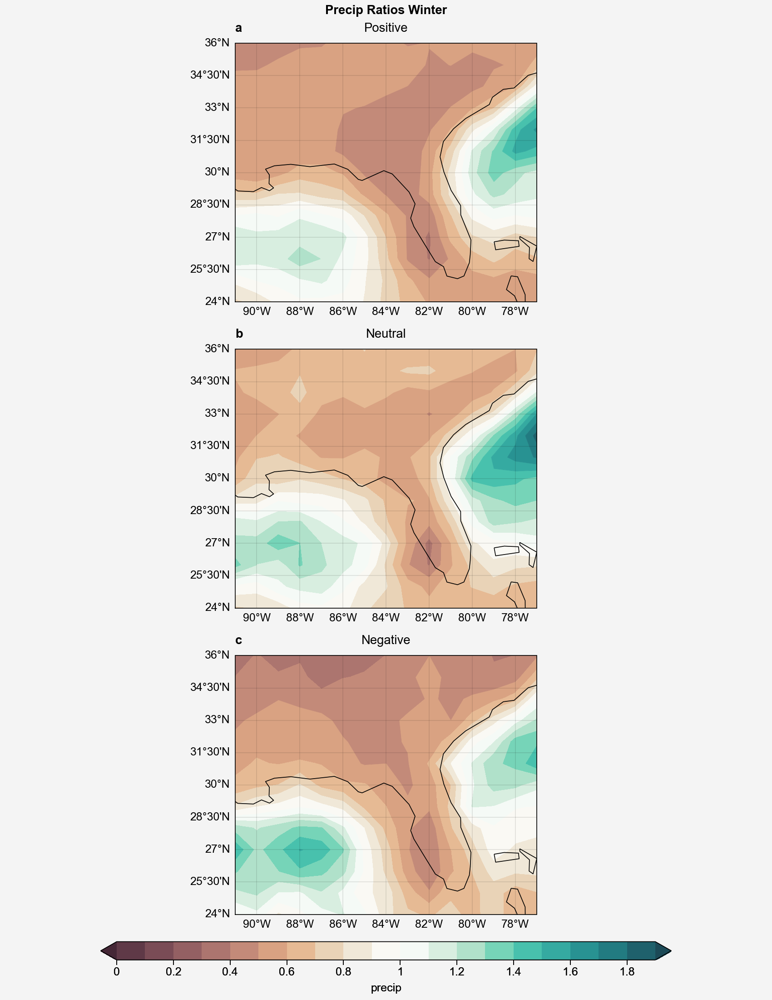

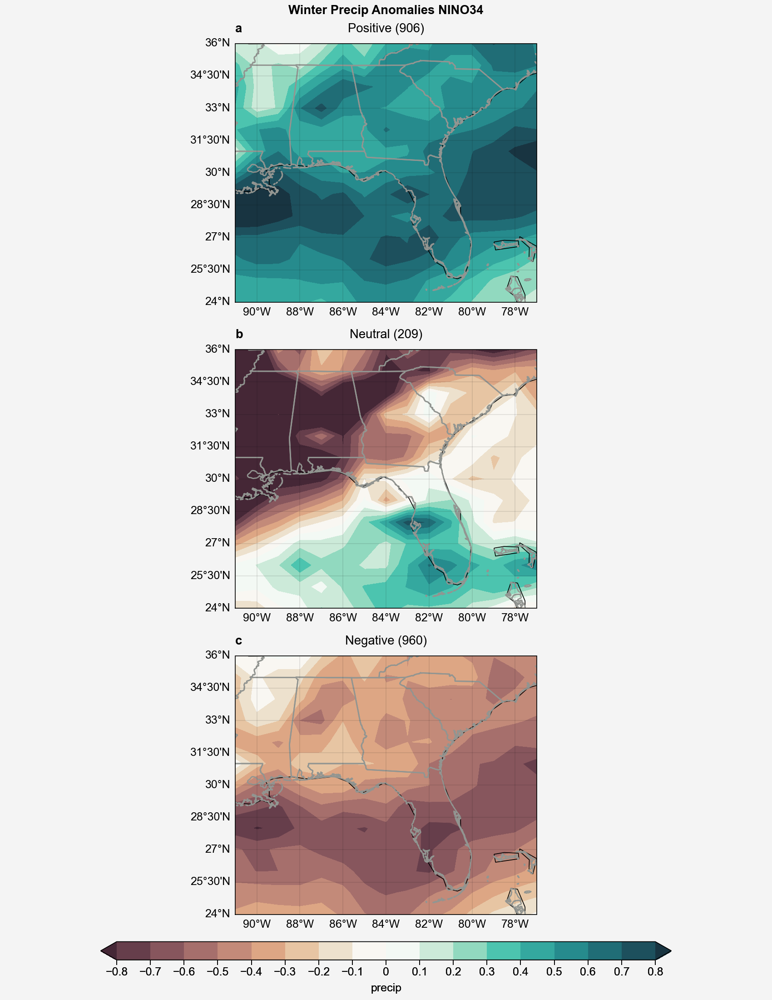

...

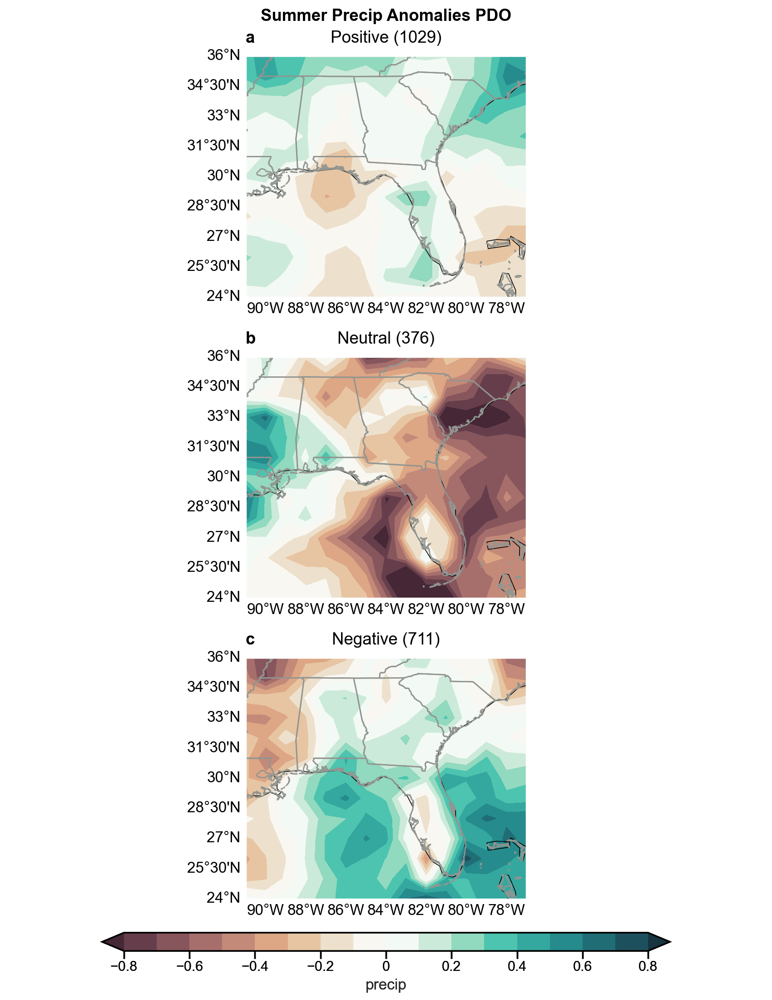

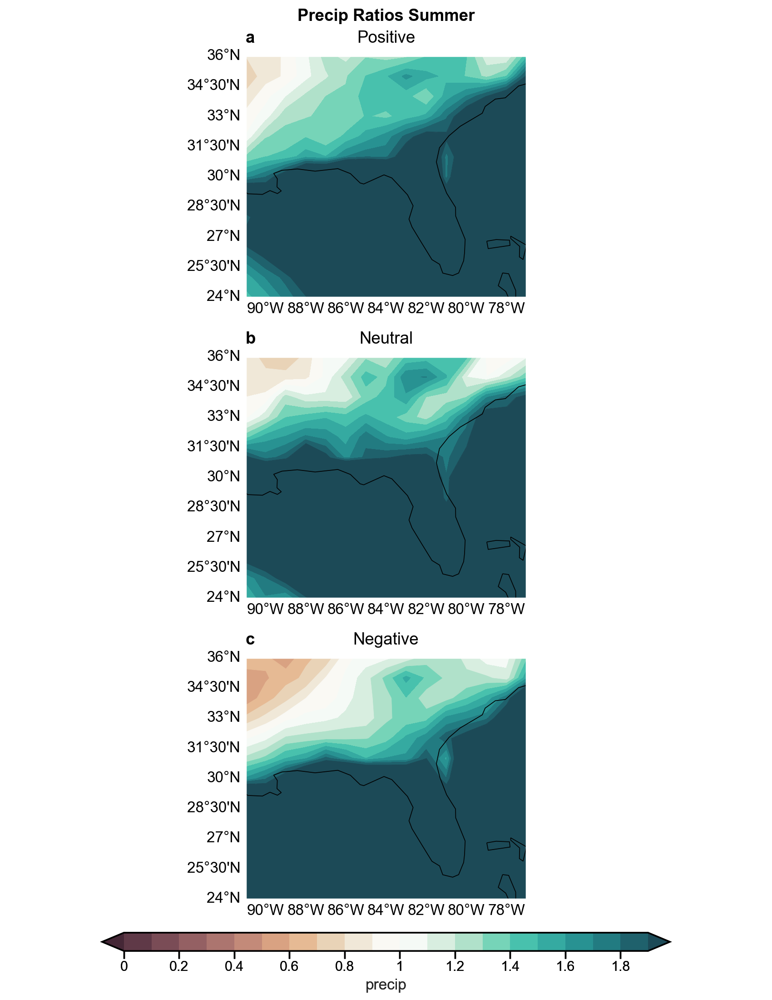

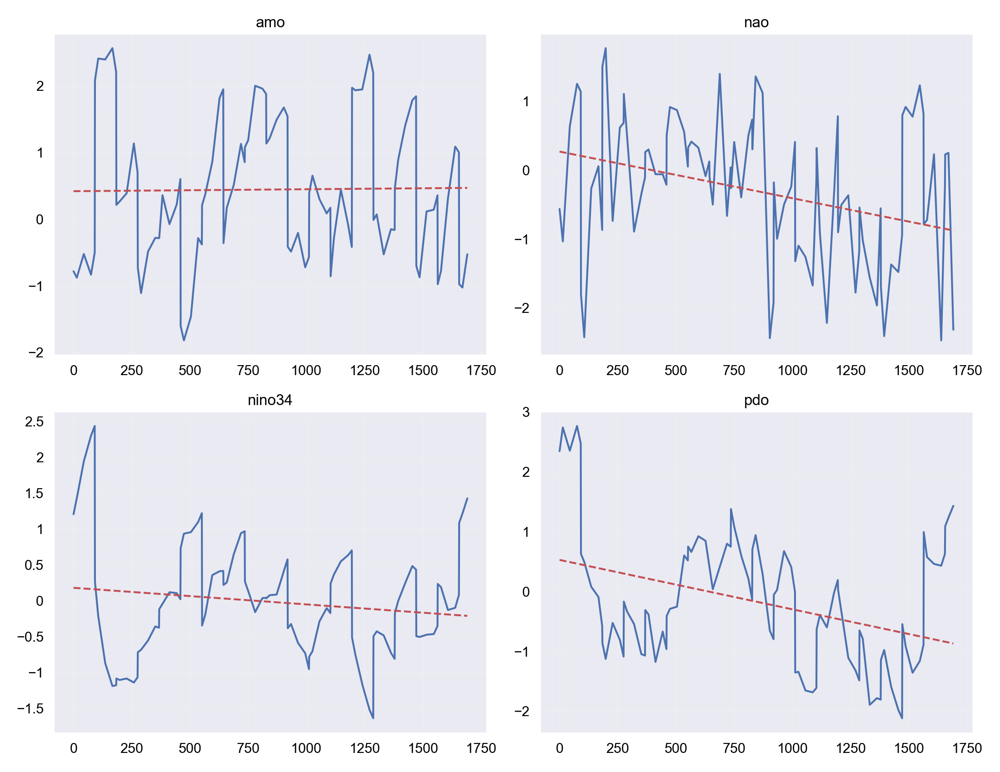

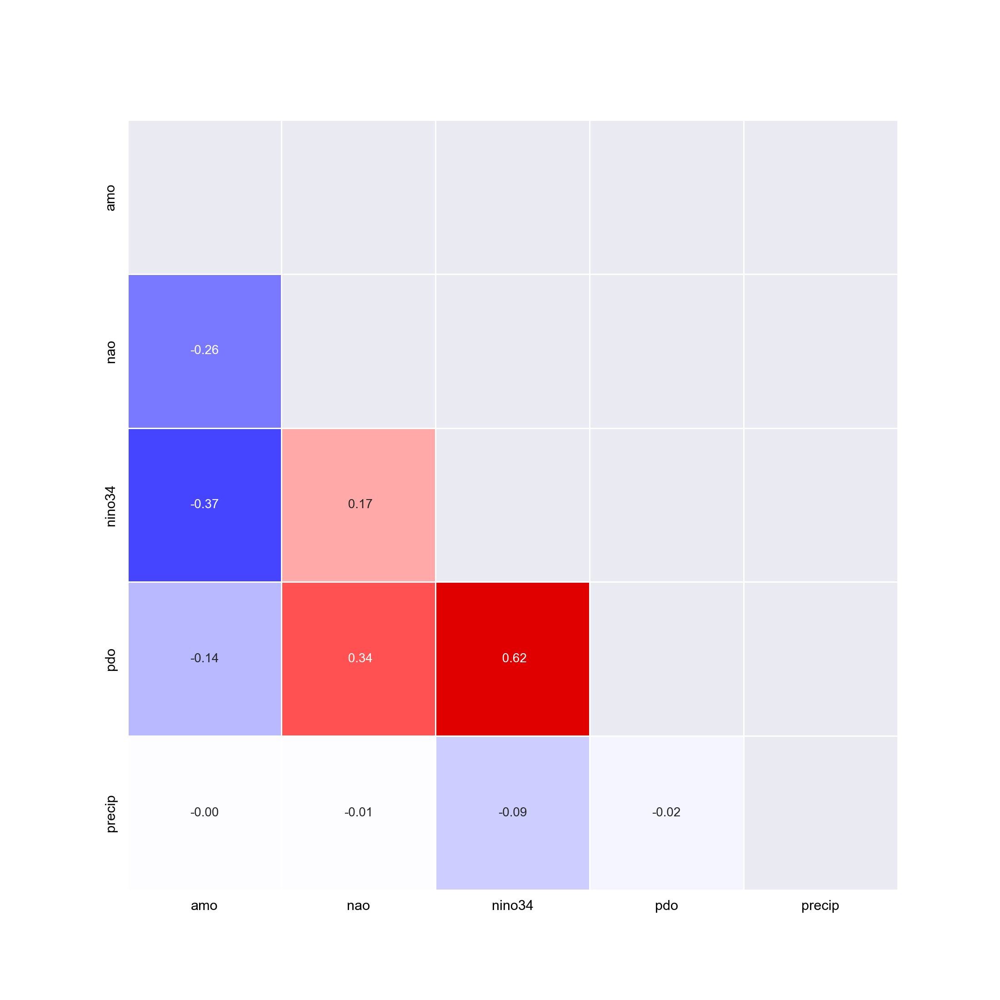

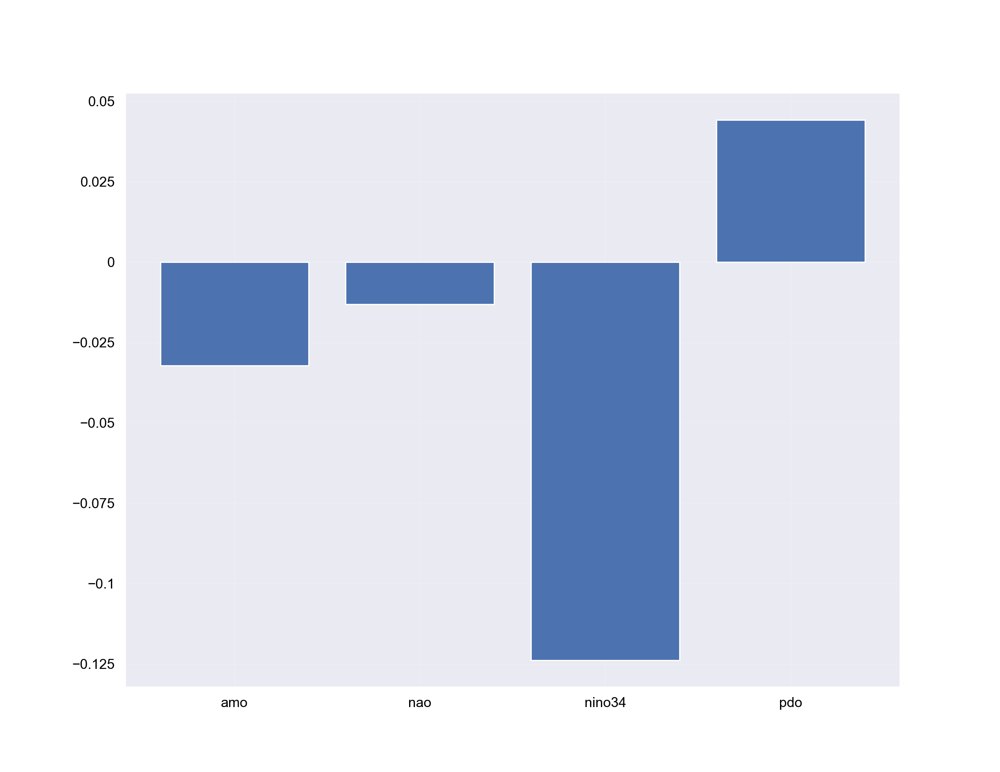

In [17]:
# Loop over seasons
for seas,slabel in zip([winter,summer],['Winter','Summer']):
    
    print(slabel)
    
    # Select season for indices, precip
    ds_i=ds_indices.sel(time=ds_indices['time.month'].isin(seas))
    ds_p=ds_anoms.sel(time=ds_anoms['time.month'].isin(seas))
    ds_pfull=ds_seus.sel(time=ds_seus['time.month'].isin(seas))
    
    # Composites based on indices for this season
    for i,f in enumerate(indices):
        
        print(f.upper())
        
        ds_bins=makeBins(ds_i,f,3)
        ds=xr.merge([ds_p,ds_bins])
        ds_full=xr.merge([ds_pfull,ds_bins])
        
        #---------- COMPOSITES ------------#
        ds_comp,totals=calcComposites(ds,f,labels)
        ds_totals=xr.concat(totals,dim=f+'_bins').to_dataset(name='bins_count')
 
        suptitle=slabel+' '+v.capitalize()+' Anomalies '+f.upper()
        compfile='../figs/comp_anomaly.daily.'+slabel+'.'+v+'.'+f+'.png'
        plotComposites(ds_comp,f,totals,suptitle,labels,clevs,cmap,compfile)
        
        
        #---------- FREQUENCY RATIOS -------#
        
        # Calculate Freq Ratio
        da_above,da_below,da_ratio=calcRatios(ds_full,f,'precip',0.01)
                                  
        # Plot Freq Ratio 
        suptitle=v.capitalize()+' Ratios '+slabel
        compfile='../figs/comp_ratio.daily.'+slabel+'.'+f+'.png'
        clevs_ratio=np.arange(0,2,0.1)
        plotRatios(da_ratio,f,suptitle,labels,clevs_ratio,cmap,compfile)
        
        
    # ML Model for this season
    
    # Setup Features (X) and Target (Y)
    # Features: AMO, NAO, Nino34, PDO; Target: SEUS Precip Index
    
    X=np.stack((ds_i['amo'].values,ds_i['nao'].values,ds_i['nino34'],ds_i['pdo']),axis=-1)
    Y=ds_i['precip'].values

    print('Check Features and Target Dimensions')
    print('Features (X): ',X.shape)
    print('Target (Y): ',Y.shape)

    nsamples=X.shape[0]
    nfeatures=X.shape[1]

    print("Samples: ",nsamples)
    print("Features: ", nfeatures)
    
    # Create Train and Test Sets
    X_train, X_test, Y_train, Y_test = train_test_split(X,Y,train_size=0.8,shuffle=False)

    ntrain=X_train.shape[0]
    ntest=X_test.shape[0]

    print('Training Size: ',ntrain)
    print('Testing Size: ',ntest)
    
    # Take a look at the Training Data
    
    plt.figure(figsize=(11,8.5))
    y=np.arange(ntrain)

    for i,f in enumerate(indices):

        plt.subplot(2,2,i+1)

        z = np.polyfit(y,X_train[:,i],1)
        p = np.poly1d(z)
    
        plt.plot(y,X_train[:,i])
        plt.plot(p(y),"r--")
        plt.title(f)

        print("Check Stats: ", "Index: ",f, "Mean: ", X_train[:,i].mean(axis=0),"Var: ", X_train[:,i].var(axis=0))
    plt.tight_layout()  
    
    # Make a heatmap
    heatmap(X_train,Y_train,list(ds_i.keys()))
    
    # Train the Models
    regr_lr,coeffs_lr,rsq_train_lr,Ypred_lr=lr(X_train,Y_train)
    print('R^2 Train Standard : ', rsq_train_lr)
    regr_lasso,coeffs_lasso,rsq_train_lasso,Ypred_lasso=lasso(X_train,Y_train)
    print('R^2 Train LASSO : ', rsq_train_lasso)
    regr_ridge,coeffs_ridge,rsq_train_ridge,Ypred_ridge=ridge(X_train,Y_train)
    print('R^2 Train Ridge : ', rsq_train_ridge)
    nn=tomsensomodel_regression(X_train,Y_train)
    rsq_train_nn,Y_pred_train_nn=get_r2(X_train,Y_train,nn)
    print('R^2 Train NN: ',rsq_train_nn)
    
    # Predict for Test
    rsq_test_lr,Y_pred_test_lr=get_r2(X_test,Y_test,regr_lr)
    print('R^2 Test Standard: ',rsq_test_lr)
    rsq_test_lasso,Y_pred_test_lasso=get_r2(X_test,Y_test,regr_lasso)
    print('R^2 Test Lasso: ',rsq_test_lasso)
    rsq_test_ridge,Y_pred_test_ridge=get_r2(X_test,Y_test,regr_ridge)
    print('R^2 Test Ridge: ',rsq_test_lr)
    rsq_test_nn,Y_pred_test_nn=get_r2(X_test,Y_test,nn)
    print('R^2 Test NN: ',rsq_test_nn)
    
    # Plot Coefficients for Standard Linear Regression
    plt.figure(figsize=(11,8.5))
    plt.bar(indices,coeffs_lr)